### Collect 100 Artists Information using Spotify API

In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from tqdm import tqdm
import json
import time

#  Spotify API 
CLIENT_ID = 'b3be64de59984fcc86012f2b090f6d1c'
CLIENT_SECRET = 'f33f3131cfa443aaba1531103258e934'

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(
    client_id=CLIENT_ID,
    client_secret=CLIENT_SECRET
))

def get_top_artists(limit=1000, market='US'):
    artists = []
    seen_ids = set()
    offset = 0
    batch_size = 50  # Spotify API 50 max limit

    # search different genres
    genres = ['pop', 'rock', 'hip hop', 'indie', 'electronic', 'country', 'jazz', 'metal', 'blues', 'folk']
    for genre in genres:
        for i in range(0, limit, batch_size):
            try:
                results = sp.search(q=f'genre:"{genre}"', type='artist', limit=batch_size, offset=i, market=market)
                for artist in results['artists']['items']:
                    if artist['id'] not in seen_ids:
                        artists.append(artist)
                        seen_ids.add(artist['id'])
                        if len(artists) >= limit:
                            return artists
                time.sleep(0.2)  # prevent rate limit
            except Exception as e:
                print(f"Error: {e}")
                time.sleep(2)
    return artists[:limit]

In [ ]:
artists = get_top_artists(limit=100)
print(f"Collected {len(artists)} artists.")
# save as json
with open("top_100_western_artists.json", "w", encoding="utf-8") as f:
    json.dump(artists, f, ensure_ascii=False, indent=2)

### collect top 5 songs for each artist from last.fm

In [ ]:
import json
import time
from tqdm import tqdm
import requests
import os

# read artist list
with open('top_100_western_artists.json', 'r', encoding='utf-8') as f:
    artists = json.load(f)

LASTFM_API_KEY = '3bb23251ac9d599659ba4e31a9a9ea56'  # last.fm api

LASTFM_URL = "http://ws.audioscrobbler.com/2.0/"

def get_lastfm_top_tracks(artist_name, limit=5):  # default 5
    params = {
        'method': 'artist.gettoptracks',
        'artist': artist_name,
        'api_key': LASTFM_API_KEY,
        'format': 'json',
        'limit': limit
    }
    try:
        resp = requests.get(LASTFM_URL, params=params, timeout=10)
        resp.raise_for_status()
        data = resp.json()
        tracks = data.get('toptracks', {}).get('track', [])
        # as list 
        if isinstance(tracks, dict):
            tracks = [tracks]
        track_infos = []
        for track in tracks:
            info = {
                'track_name': track.get('name'),
                'playcount': track.get('playcount'),
                'listeners': track.get('listeners'),
                'mbid': track.get('mbid'),
                'url': track.get('url'),
                'artist': track.get('artist', {}).get('name'),
                'rank': track.get('@attr', {}).get('rank'),
            }
            track_infos.append(info)
        return track_infos
    except Exception as e:
        print(f"Error fetching last.fm tracks for {artist_name}: {e}")
        return []

# 
SAVE_PATH = 'top_artists_lastfm_top_tracks.json'
if os.path.exists(SAVE_PATH):
    with open(SAVE_PATH, 'r', encoding='utf-8') as f:
        lastfm_tracks_dict = {t['artist']: t['tracks'] for t in json.load(f)}
else:
    lastfm_tracks_dict = {}

results = []
for artist in tqdm(artists, desc="Processing artists (last.fm)"):
    artist_name = artist.get('name')
    if not artist_name:
        continue
    if artist_name in lastfm_tracks_dict:
        # skipped
        results.append({'artist': artist_name, 'tracks': lastfm_tracks_dict[artist_name]})
        continue
    tracks = get_lastfm_top_tracks(artist_name, limit=5)  # limit 5
    results.append({'artist': artist_name, 'tracks': tracks})
    # increased writing
    with open(SAVE_PATH, 'w', encoding='utf-8') as f:
        json.dump(results, f, ensure_ascii=False, indent=2)
    time.sleep(0.2)

### collect song metadata and lyrics

In [ ]:
import json
import os
import time
from tqdm import tqdm
import requests
import re
import lyricsgenius
from concurrent.futures import ThreadPoolExecutor, as_completed

GENIUS_API_TOKEN = 'Lqs1kZHG58P6O0y6Fi754eT-92aWDRxzdXZmdd_Tb4VgPCIsEXf-sUphVkbvitkt'
LASTFM_API_KEY = '3bb23251ac9d599659ba4e31a9a9ea56'

genius = lyricsgenius.Genius(GENIUS_API_TOKEN, skip_non_songs=True, excluded_terms=["(Remix)", "(Live)"], timeout=10, retries=3)

def get_genius_song_info(artist, title):
    try:
        song = genius.search_song(title, artist)
        if song:
            writers = []
            if hasattr(song, 'writer_artists') and song.writer_artists:
                writers = [w.get("name") for w in song.writer_artists if "name" in w]
            return {
                "genius_id": song.id,
                "lyrics_url": song.url,
                "writers": writers,
                "lyrics": song.lyrics
            }
        return None
    except Exception as e:
        print(f"Genius error for {artist} - {title}: {e}")
        return None

def get_lastfm_tags(artist, title):
    return []

def safe_filename(s):
    return re.sub(r'[\\/*?:"<>|]', "_", s)

def save_lyrics_to_file(artist, title, lyrics):
    artist_dir = os.path.join("artists", safe_filename(artist))
    os.makedirs(artist_dir, exist_ok=True)
    song_file = os.path.join(artist_dir, safe_filename(title) + ".txt")
    with open(song_file, "w", encoding="utf-8") as f:
        f.write(lyrics)

def load_last_result(path):
    if os.path.exists(path):
        with open(path, "r", encoding="utf-8") as f:
            return json.load(f)
    return []

def save_result(path, data):
    with open(path, "w", encoding="utf-8") as f:
        json.dump(data, f, ensure_ascii=False, indent=2)

def process_track(artist, track, done):
    title = track.get("track_name")
    if not title or (artist, title) in done:
        return done.get((artist, title), track)
    genius_info = get_genius_song_info(artist, title)
    track["lyrics_url"] = genius_info["lyrics_url"] if genius_info else None
    track["writers"] = genius_info["writers"] if genius_info else []
    if genius_info and genius_info.get("lyrics"):
        save_lyrics_to_file(artist, title, genius_info["lyrics"])
    return track

def collect_lyrics():
    with open("top_artists_lastfm_top_tracks.json", "r", encoding="utf-8") as f:
        artists_tracks = json.load(f)

    save_path = "top_artists_tracks_lyrics_tags.json"
    done = { (item["artist"], t["track_name"]): t for item in load_last_result(save_path) for t in item["tracks"] }
    result = []

    max_workers = 8  # thread nums
    for artist_item in tqdm(artists_tracks, desc="Processing artists"):
        artist = artist_item["artist"]
        tracks = artist_item["tracks"]
        tracks_out = []
        with ThreadPoolExecutor(max_workers=max_workers) as executor:
            futures = [executor.submit(process_track, artist, track, done) for track in tracks]
            for future in as_completed(futures):
                track_result = future.result()
                tracks_out.append(track_result)
        # keep origin order
        tracks_out_sorted = sorted(tracks_out, key=lambda t: next((i for i, tr in enumerate(tracks) if tr.get("track_name") == t.get("track_name")), 0))
        result.append({"artist": artist, "tracks": tracks_out_sorted})
        save_result(save_path, result)
        # time.sleep(0.1)  

collect_lyrics()


### tf-idf based analysis

### PCA and T-SNE

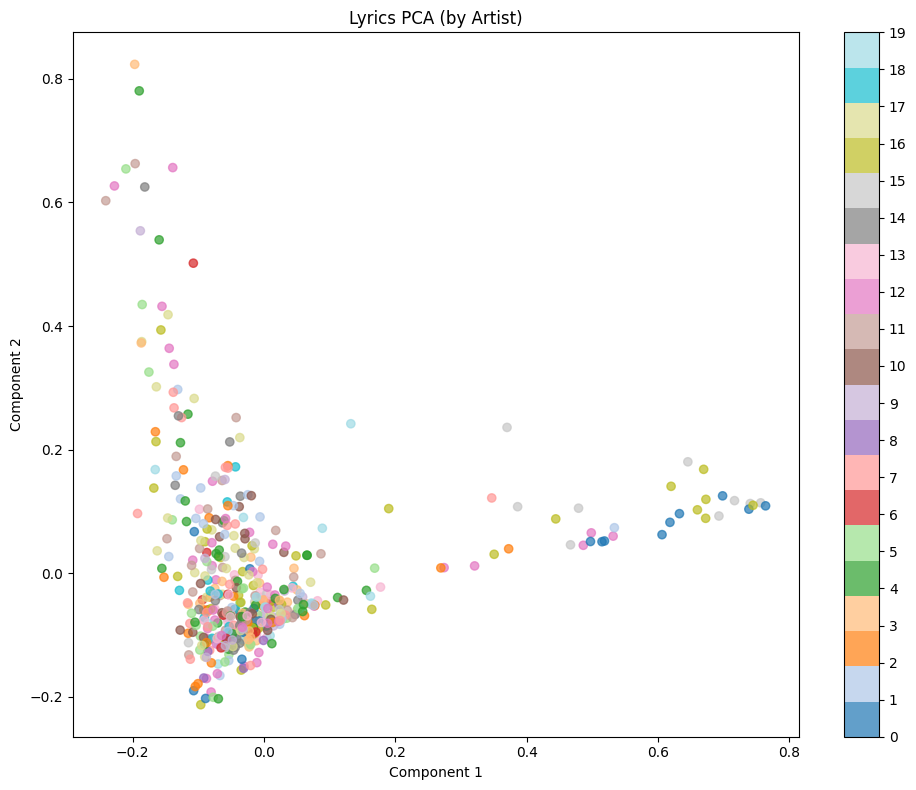

/home/zerkvii/.pyenv/versions/3.9.11/envs/nlpenv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


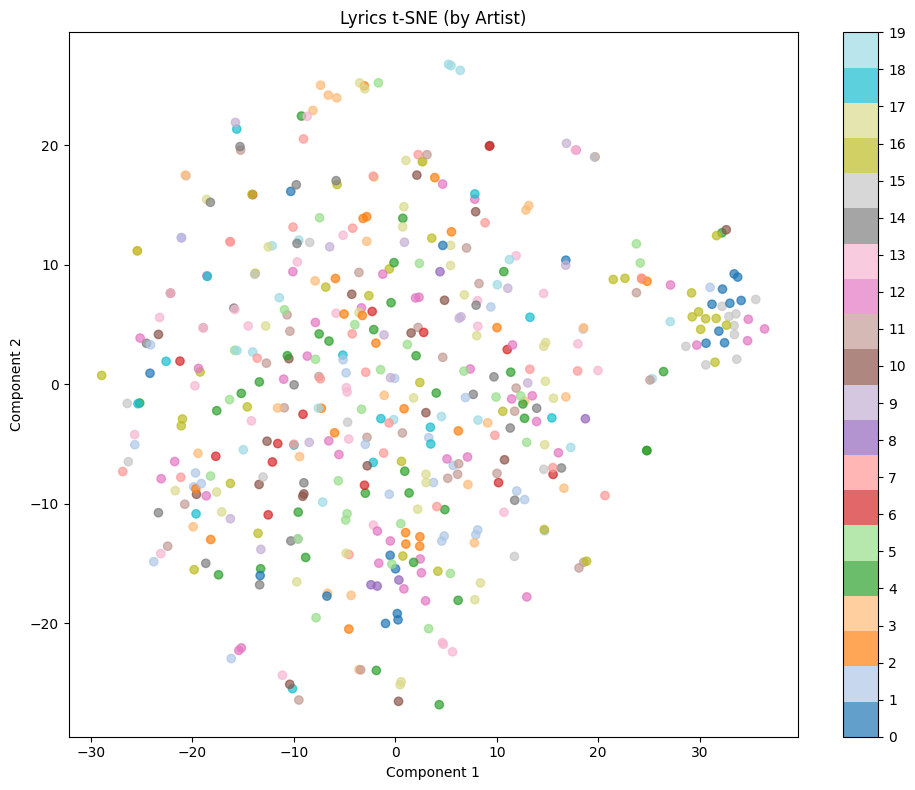

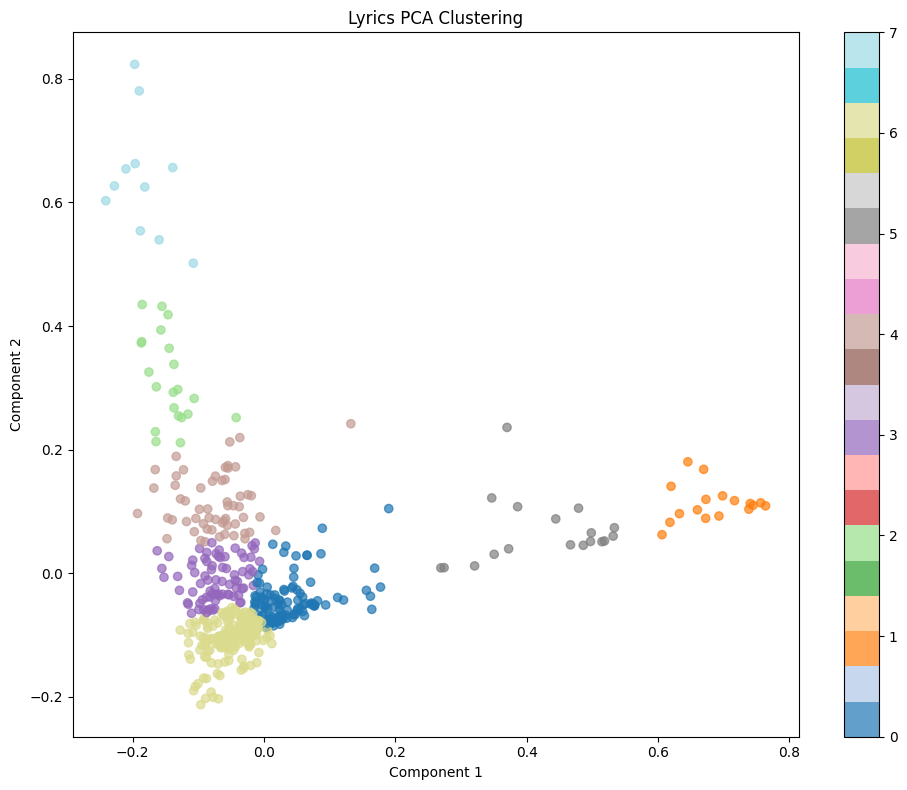

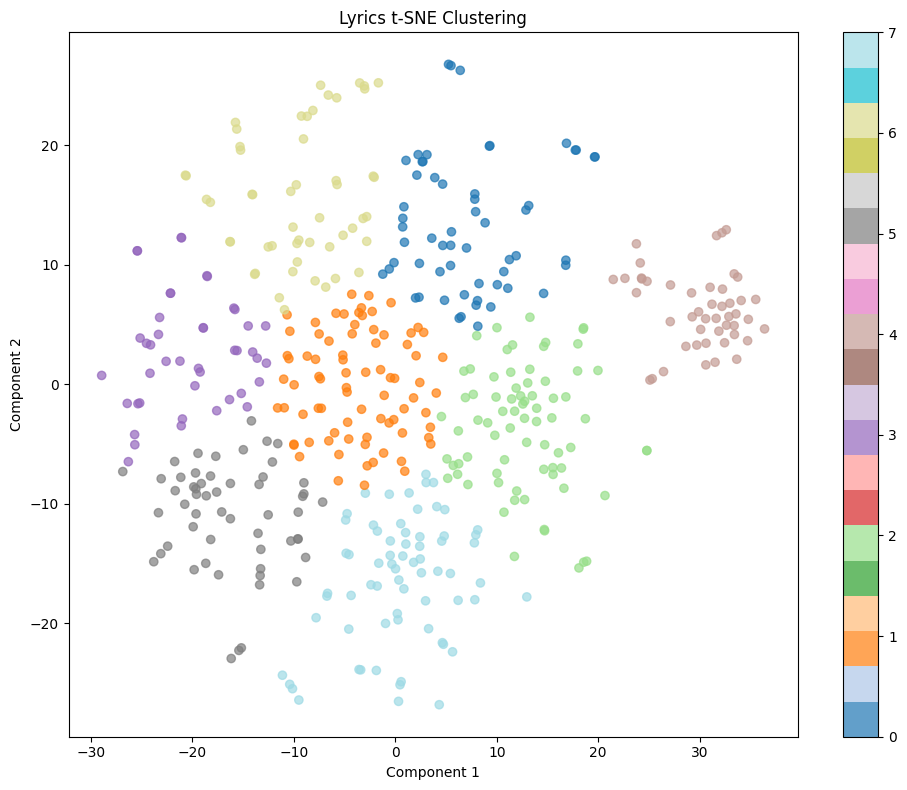

In [6]:
import os
import glob
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def load_lyrics(lyrics_root="artists"):
    data = []
    for artist_dir in os.listdir(lyrics_root):
        artist_path = os.path.join(lyrics_root, artist_dir)
        if not os.path.isdir(artist_path):
            continue
        for song_file in glob.glob(os.path.join(artist_path, "*.txt")):
            song_title = os.path.splitext(os.path.basename(song_file))[0]
            with open(song_file, "r", encoding="utf-8") as f:
                lyrics = f.read()
            data.append({
                "artist": artist_dir,
                "song": song_title,
                "lyrics": lyrics
            })
    return data

def plot_2d(X, labels, title):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='tab20', alpha=0.7)
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.colorbar(scatter, ticks=range(len(set(labels))))
    plt.tight_layout()
    plt.show()

def pca_tsne():
    lyrics_data = load_lyrics()
    texts = [item["lyrics"] for item in lyrics_data]
    artists = [item["artist"] for item in lyrics_data]
    titles = [f"{item['artist']} - {item['song']}" for item in lyrics_data]

    # vectorize
    vectorizer = TfidfVectorizer(max_features=1000, stop_words="english")
    X = vectorizer.fit_transform(texts).toarray()

    # PCA 
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    plot_2d(X_pca, [hash(a) % 20 for a in artists], "Lyrics PCA (by Artist)")

    # t-SNE 
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
    X_tsne = tsne.fit_transform(X)
    plot_2d(X_tsne, [hash(a) % 20 for a in artists], "Lyrics t-SNE (by Artist)")

    # clustering
    n_clusters = 8  # 
    kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels_pca = kmeans_pca.fit_predict(X_pca)
    kmeans_tsne = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels_tsne = kmeans_tsne.fit_predict(X_tsne)

    # visualize 
    plot_2d(X_pca, labels_pca, "Lyrics PCA Clustering")
    plot_2d(X_tsne, labels_tsne, "Lyrics t-SNE Clustering")

    # save to json
    pca_tsne_result = []
    for idx, item in enumerate(lyrics_data):
        pca_coords = X_pca[idx].tolist()
        tsne_coords = X_tsne[idx].tolist()
        pca_tsne_result.append({
            "artist": item["artist"],
            "song": item["song"],
            "pca": pca_coords,
            "tsne": tsne_coords,
            "pca_cluster": int(labels_pca[idx]),
            "tsne_cluster": int(labels_tsne[idx])
        })
    with open("lyrics_pca_tsne_result.json", "w", encoding="utf-8") as f:
        json.dump(pca_tsne_result, f, ensure_ascii=False, indent=2)


pca_tsne()

### Collect emotions and themes using tf-idf, roberta_base_go and deepseek

In [8]:

import os
import glob
import json
from tqdm import tqdm
from openai import OpenAI
from transformers import pipeline
from sklearn.feature_extraction.text import TfidfVectorizer

def call_deepseek_api(lyrics, api_key):
    client = OpenAI(api_key=api_key, base_url="https://api.deepseek.com")
    prompt = (
        "Extract theme keywords and classify emotions from the following English lyrics. Each song can have multiple theme tags and multiple emotion tags. "
        "Return a JSON in the format: {\"emotions\": [...], \"themes\": [...]}.\n\n"
        f"Lyrics:\n{lyrics}\n"
        "Output only the JSON without any additional content."
    )
    try:
        response = client.chat.completions.create(
            model="deepseek-chat",
            messages=[
                {"role": "system", "content": "You are a helpful assistant"},
                {"role": "user", "content": prompt},
            ],
            stream=False,
            temperature=0.2,
            max_tokens=512
        )
        content = response.choices[0].message.content
        start = content.find('{')
        end = content.rfind('}') + 1
        json_str = content[start:end]
        result = json.loads(json_str)
        if "keywords" in result and "themes" not in result:
            result["themes"] = result.pop("keywords")
        if "emotions" not in result:
            result["emotions"] = []
        if "themes" not in result:
            result["themes"] = []
        return result
    except Exception as e:
        print(f"DeepSeek API error: {e}")
        return {"emotions": [], "themes": []}

def load_lyrics(lyrics_root="artists"):
    data = []
    for artist_dir in os.listdir(lyrics_root):
        artist_path = os.path.join(lyrics_root, artist_dir)
        if not os.path.isdir(artist_path):
            continue
        for song_file in glob.glob(os.path.join(artist_path, "*.txt")):
            song_title = os.path.splitext(os.path.basename(song_file))[0]
            with open(song_file, "r", encoding="utf-8") as f:
                lyrics = f.read()
            data.append({
                "artist": artist_dir,
                "song": song_title,
                "lyrics": lyrics
            })
    return data

def load_last_result(path):
    if os.path.exists(path):
        with open(path, "r", encoding="utf-8") as f:
            return json.load(f)
    return {}

def extract_roberta_emotion(lyrics, classifier, max_length=512):
    try:
        # maxlength 512
        from transformers import AutoTokenizer
        tokenizer = AutoTokenizer.from_pretrained("SamLowe/roberta-base-go_emotions")
        tokens = tokenizer(lyrics, truncation=True, max_length=max_length, return_tensors="pt")
        # decode
        truncated_lyrics = tokenizer.decode(tokens["input_ids"][0], skip_special_tokens=True)
        outputs = classifier([truncated_lyrics])
        emotions = [d['label'] for d in outputs[0] if d['score'] > 0.1]
        return emotions
    except Exception as e:
        print(f"Roberta emotion error: {e}")
        return []

def extract_tfidf_themes(lyrics, vectorizer, feature_names, top_n=5):
    try:
        tfidf = vectorizer.transform([lyrics])
        scores = tfidf.toarray()[0]
        top_indices = scores.argsort()[-top_n:][::-1]
        themes = [feature_names[i] for i in top_indices if scores[i] > 0]
        return themes
    except Exception as e:
        print(f"TF-IDF theme error: {e}")
        return []

def collect_emotion_and_theme():
    api_key = "sk-3cce02b7d5c64da9b00770da0f2a3cd9"  # Replace with your DeepSeek API Key
    save_path = "artist_song_emotion_theme.json"
    lyrics_data = load_lyrics()
    result = load_last_result(save_path)
    # already processed
    done = set()
    for artist, song_list in result.items():
        for song_obj in song_list:
            for song in song_obj:
                done.add((artist, song))

    # init
    classifier = pipeline(task="text-classification", model="SamLowe/roberta-base-go_emotions", top_k=None)
    from transformers import AutoTokenizer
    tokenizer = AutoTokenizer.from_pretrained("SamLowe/roberta-base-go_emotions")

    # TF-IDF themes
    all_lyrics = [item["lyrics"] for item in lyrics_data]
    vectorizer = TfidfVectorizer(max_features=1000, stop_words="english")
    vectorizer.fit(all_lyrics)
    feature_names = vectorizer.get_feature_names_out()

    for item in tqdm(lyrics_data, desc="DeepSeek/Roberta/TFIDF"):
        artist = item["artist"]
        song = item["song"]
        lyrics = item["lyrics"]
        if (artist, song) in done:
            continue
        # DeepSeek themes and emotions
        analysis = call_deepseek_api(lyrics, api_key)
        # Roberta emotion
        roberta_emotion = extract_roberta_emotion(lyrics, classifier, max_length=512)
        # TF-IDF themes
        tfidf_themes = extract_tfidf_themes(lyrics, vectorizer, feature_names, top_n=5)
        # merge
        song_data = {
            "emotions": analysis["emotions"],
            "themes": analysis["themes"],
            "roberta_emotion": roberta_emotion,
            "tfidf_themes": tfidf_themes
        }
        if artist not in result:
            result[artist] = []
        result[artist].append({song: song_data})
        # save with increasing
        with open(save_path, "w", encoding="utf-8") as f:
            json.dump(result, f, ensure_ascii=False, indent=2)

collect_emotion_and_theme()

Device set to use xpu:0
DeepSeek/Roberta/TFIDF: 100%|██████████| 478/478 [57:13<00:00,  7.18s/it]


### ner using roberta-large-ner-english

In [10]:
import os
import glob
import json
import re
from tqdm import tqdm
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline

def load_lyrics(lyrics_root="artists"):
    data = []
    for artist_dir in os.listdir(lyrics_root):
        artist_path = os.path.join(lyrics_root, artist_dir)
        if not os.path.isdir(artist_path):
            continue
        for song_file in glob.glob(os.path.join(artist_path, "*.txt")):
            song_title = os.path.splitext(os.path.basename(song_file))[0]
            with open(song_file, "r", encoding="utf-8") as f:
                lyrics = f.read()
            data.append({
                "artist": artist_dir,
                "song": song_title,
                "lyrics": lyrics
            })
    return data

def normalize_entity(text):
    text = text.strip()
    text = re.sub(r"\s+", " ", text)
    if text.upper() in {"US", "U.S.", "USA", "U.S.A.", "United States", "United States of America"}:
        return "United States"
    if text.upper() in {"UK", "U.K.", "United Kingdom", "Great Britain", "Britain"}:
        return "United Kingdom"
    if text.upper() in {"PRC", "P.R.C.", "China", "People's Republic of China"}:
        return "China"
    if text.upper() in {"Russia", "Russian Federation"}:
        return "Russia"
    if text.upper() in {"France", "French Republic"}:
        return "France"
    if text.upper() in {"Germany", "Federal Republic of Germany"}:
        return "Germany"
    if text.upper() in {"Canada"}:
        return "Canada"
    if text.upper() in {"Australia", "Commonwealth of Australia"}:
        return "Australia"
    return text

def extract_ner_entities(lyrics, ner_pipeline):
    people = set()
    locations = set()
    organizations = set()
    try:
        ner_results = ner_pipeline(lyrics)
        for ent in ner_results:
            label = ent["entity_group"] if "entity_group" in ent else ent["entity"]
            text = normalize_entity(ent["word"])
            if label in ["PER", "PERSON"]:
                people.add(text)
            elif label in ["LOC", "GPE", "LOCATION"]:
                locations.add(text)
            elif label in ["ORG", "ORGANIZATION"]:
                organizations.add(text)
    except Exception as e:
        print(f"NER error: {e}")
    return {
        "people": list(people),
        "locations": list(locations),
        "organizations": list(organizations)
    }

def collect_entities():
    # using Jean-Baptiste/roberta-large-ner-english
    tokenizer = AutoTokenizer.from_pretrained("Jean-Baptiste/roberta-large-ner-english")
    model = AutoModelForTokenClassification.from_pretrained("Jean-Baptiste/roberta-large-ner-english")
    ner_pipeline = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="simple")
    lyrics_data = load_lyrics()
    result = {}
    for item in tqdm(lyrics_data, desc="NER extracting"):
        artist = item["artist"]
        song = item["song"]
        lyrics = item["lyrics"]
        ner = extract_ner_entities(lyrics, ner_pipeline)
        if artist not in result:
            result[artist] = []
        result[artist].append({song: ner})
    with open("lyrics_ner_result.json", "w", encoding="utf-8") as f:
        json.dump(result, f, ensure_ascii=False, indent=2)

collect_entities()


Device set to use xpu:0
NER extracting: 100%|██████████| 478/478 [00:36<00:00, 13.24it/s]


### merge all relation metadata

In [12]:
import json
import os

def load_json(path):
    with open(path, "r", encoding="utf-8") as f:
        return json.load(f)

def merge_all_connections():
    # files
    emotion_theme_path = "artist_song_emotion_theme.json"
    ner_path = "lyrics_ner_result.json"
    pca_tsne_path = "lyrics_pca_tsne_result.json"
    save_path = "all_lyrics_analysis_merged.json"

    # load data
    emotion_theme = load_json(emotion_theme_path)
    ner = load_json(ner_path)
    pca_tsne = load_json(pca_tsne_path)

    # merge results
    merged = {}

    # iterate pca_tsne
    for item in pca_tsne:
        artist = item["artist"]
        song = item["song"]
        merged.setdefault(artist, {})
        merged[artist].setdefault(song, {})
        merged[artist][song]["pca"] = item.get("pca")
        merged[artist][song]["tsne"] = item.get("tsne")
        merged[artist][song]["pca_cluster"] = item.get("pca_cluster")
        merged[artist][song]["tsne_cluster"] = item.get("tsne_cluster")

    # merge emotion_theme
    for artist, song_list in emotion_theme.items():
        for song_obj in song_list:
            for song, data in song_obj.items():
                merged.setdefault(artist, {})
                merged[artist].setdefault(song, {})
                merged[artist][song].update(data)

    # merge ner
    for artist, song_list in ner.items():
        for song_obj in song_list:
            for song, data in song_obj.items():
                merged.setdefault(artist, {})
                merged[artist].setdefault(song, {})
                merged[artist][song]["ner"] = data

    # save
    with open(save_path, "w", encoding="utf-8") as f:
        json.dump(merged, f, ensure_ascii=False, indent=2)

merge_all_connections()


### statistical data

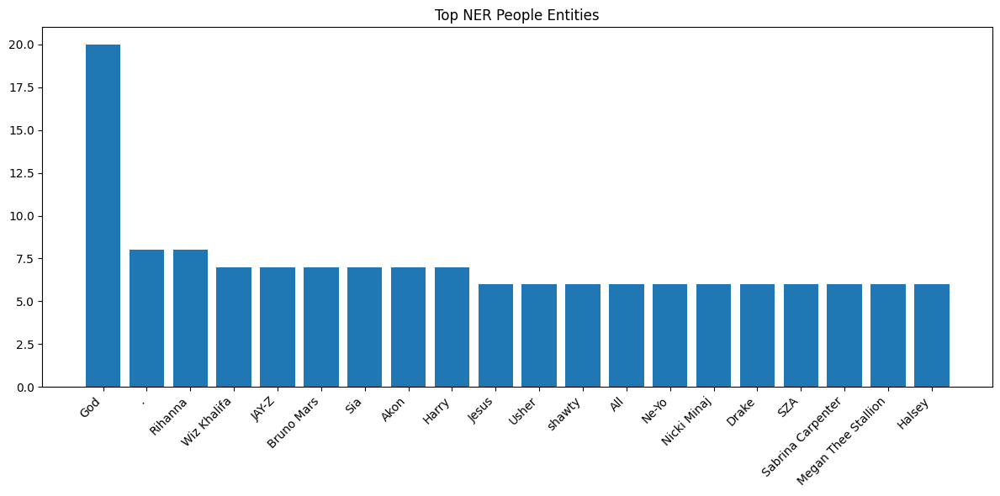

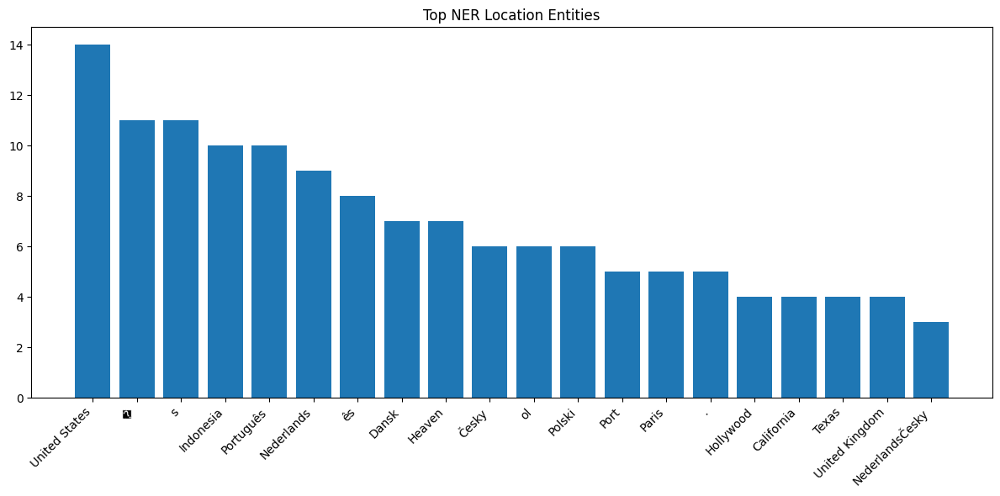

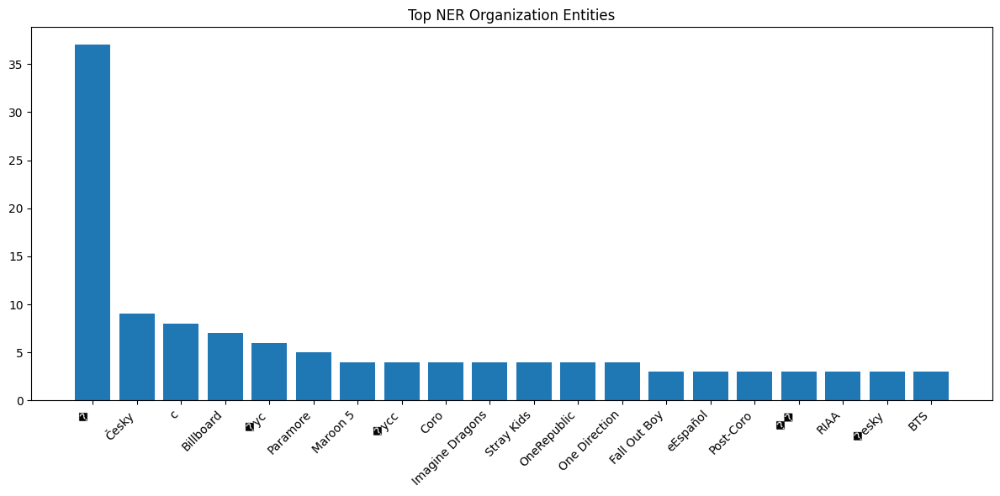

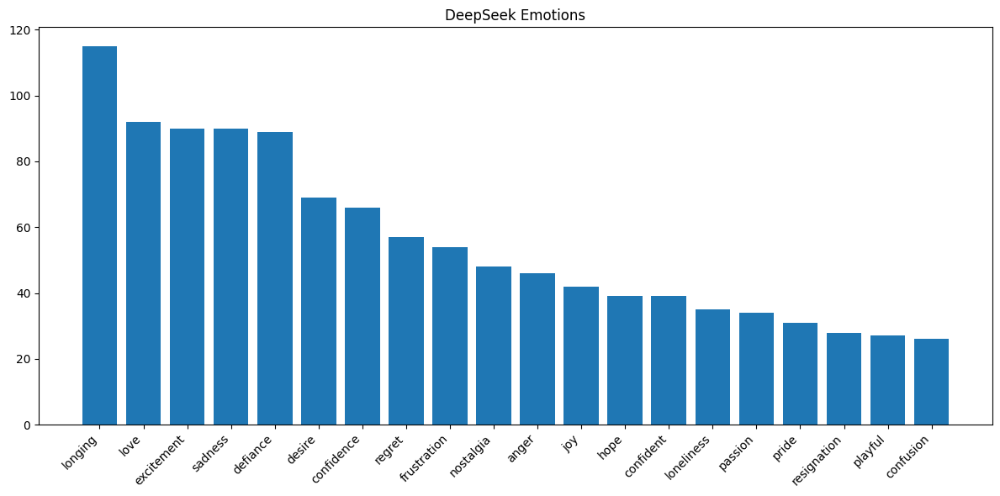

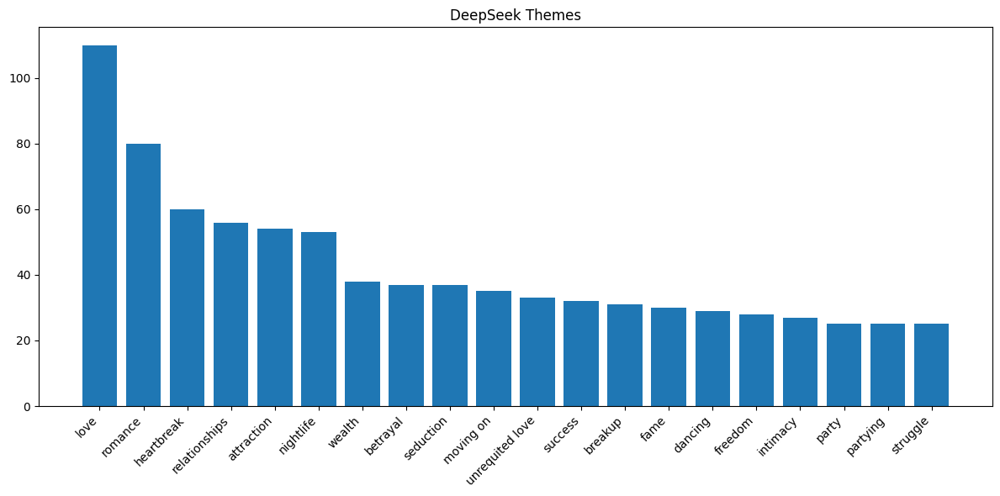

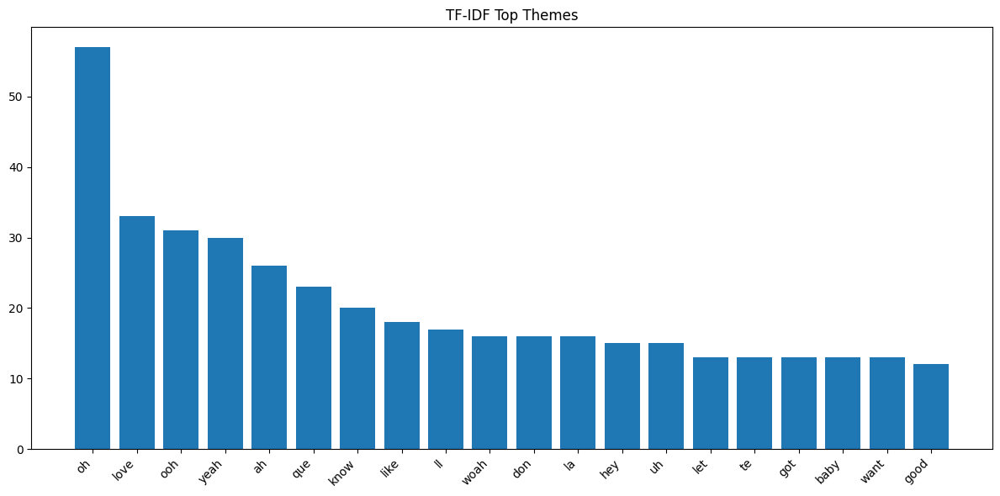

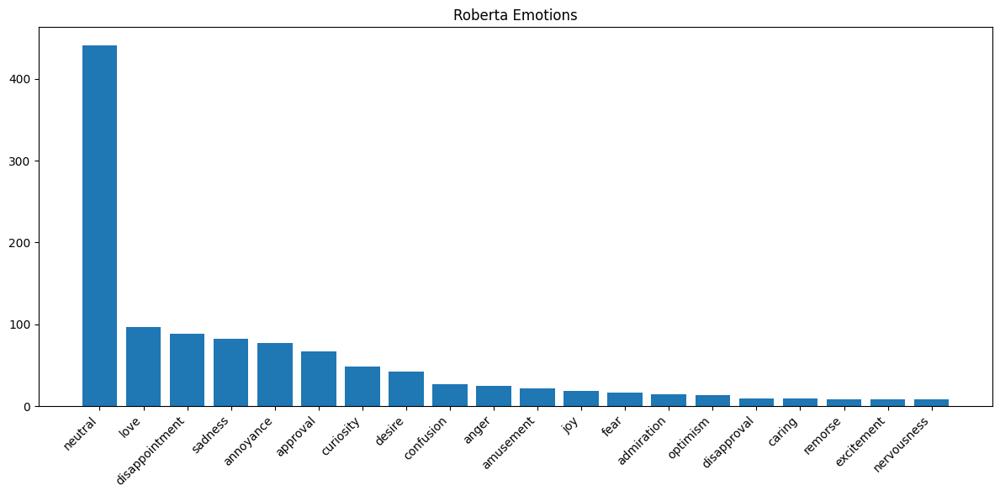

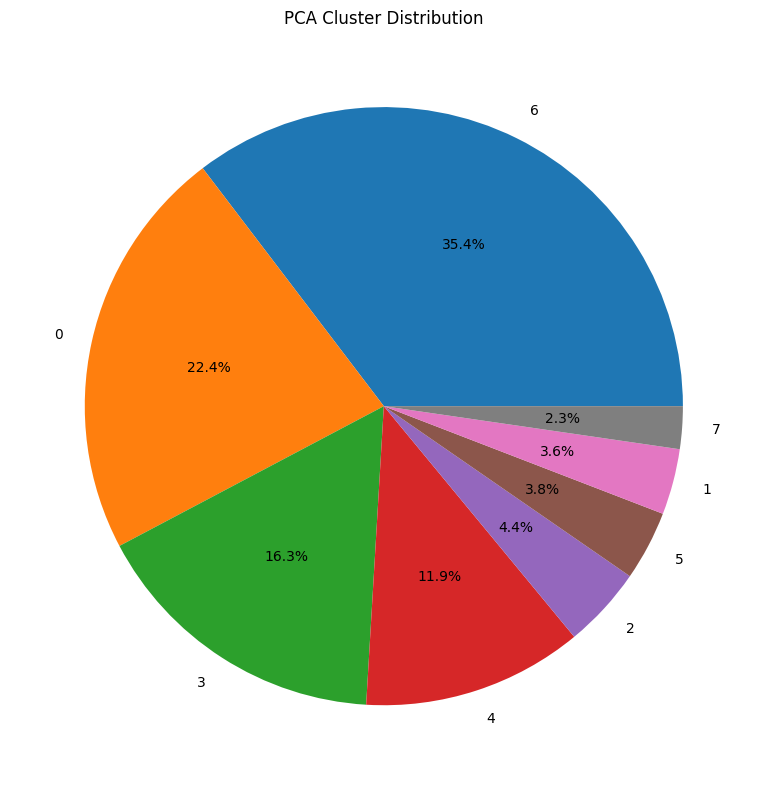

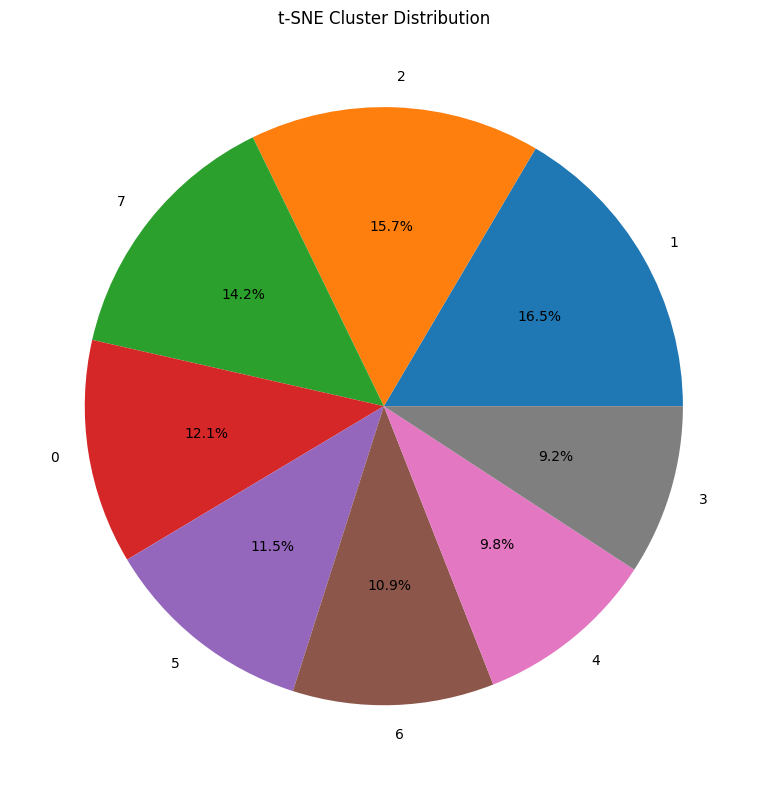

In [14]:
import json
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter, defaultdict
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

def load_merged(path="all_lyrics_analysis_merged.json"):
    with open(path, "r", encoding="utf-8") as f:
        return json.load(f)

def flatten_songs(merged):
    # return [dict(artist, song, ...all fields...)]
    songs = []
    for artist, song_dict in merged.items():
        for song, data in song_dict.items():
            entry = {"artist": artist, "song": song}
            entry.update(data)
            songs.append(entry)
    return songs

def plot_scatter(X, labels, title, label_names=None):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='tab20', alpha=0.7)
    if label_names is not None:
        plt.legend(handles=scatter.legend_elements()[0], labels=label_names)
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.tight_layout()
    plt.show()

def plot_bar(counter, title, top_n=20):
    items = counter.most_common(top_n)
    labels, values = zip(*items)
    plt.figure(figsize=(12, 6))
    plt.bar(labels, values)
    plt.title(title)
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

def plot_pie(counter, title, top_n=10):
    items = counter.most_common(top_n)
    labels, values = zip(*items)
    plt.figure(figsize=(8, 8))
    plt.pie(values, labels=labels, autopct='%1.1f%%')
    plt.title(title)
    plt.tight_layout()
    plt.show()

def draw_statistical():
    merged = load_merged()
    songs = flatten_songs(merged)

    # 1. draw pca
    pca = np.array([s["pca"] for s in songs if "pca" in s])
    pca_cluster = np.array([s["pca_cluster"] for s in songs if "pca_cluster" in s])
    # if len(pca) > 0:
    #     plot_scatter(pca, pca_cluster, "PCA Clustering")

    # 2. draw t-sne
    tsne = np.array([s["tsne"] for s in songs if "tsne" in s])
    tsne_cluster = np.array([s["tsne_cluster"] for s in songs if "tsne_cluster" in s])
    # if len(tsne) > 0:
    #     plot_scatter(tsne, tsne_cluster, "t-SNE Clustering")

    # 3. draw ner
    ner_people = Counter()
    ner_locations = Counter()
    ner_orgs = Counter()
    for s in songs:
        ner = s.get("ner", {})
        for p in ner.get("people", []):
            ner_people[p] += 1
        for l in ner.get("locations", []):
            ner_locations[l] += 1
        for o in ner.get("organizations", []):
            ner_orgs[o] += 1
    plot_bar(ner_people, "Top NER People Entities")
    plot_bar(ner_locations, "Top NER Location Entities")
    plot_bar(ner_orgs, "Top NER Organization Entities")

    # 4. draw DeepSeek emotions/themes
    deepseek_emotions = Counter()
    deepseek_themes = Counter()
    for s in songs:
        for emo in s.get("emotions", []):
            deepseek_emotions[emo] += 1
        for theme in s.get("themes", []):
            deepseek_themes[theme] += 1
    plot_bar(deepseek_emotions, "DeepSeek Emotions")
    plot_bar(deepseek_themes, "DeepSeek Themes")

    # 5. draw TF-IDF
    tfidf_theme_counter = Counter()
    for s in songs:
        for theme in s.get("tfidf_themes", []):
            tfidf_theme_counter[theme] += 1
    plot_bar(tfidf_theme_counter, "TF-IDF Top Themes")

    # 6. draw Roberta
    roberta_emotion_counter = Counter()
    for s in songs:
        for emo in s.get("roberta_emotion", []):
            roberta_emotion_counter[emo] += 1
    plot_bar(roberta_emotion_counter, "Roberta Emotions")

    # 7. draw cluster distribution
    plot_pie(Counter(pca_cluster), "PCA Cluster Distribution")
    plot_pie(Counter(tsne_cluster), "t-SNE Cluster Distribution")

draw_statistical()


### word cloud

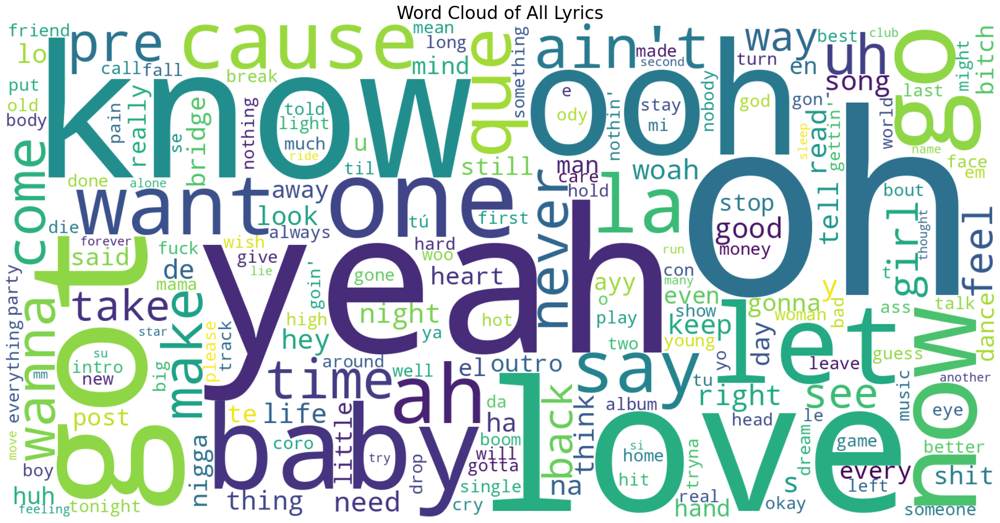

In [5]:
import os
import glob
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def load_lyrics(lyrics_root="artists"):
    texts = []
    for artist_dir in os.listdir(lyrics_root):
        artist_path = os.path.join(lyrics_root, artist_dir)
        if not os.path.isdir(artist_path):
            continue
        for song_file in glob.glob(os.path.join(artist_path, "*.txt")):
            with open(song_file, "r", encoding="utf-8") as f:
                lyrics = f.read()
            texts.append(lyrics)
    return texts

def draw_cloud():
    all_lyrics = load_lyrics()
    text = "\n".join(all_lyrics)
    text = text.lower()
    text=text.replace("\n", " ")
    text=text.replace("\t", " ")
    text=text.replace("\r", " ")
    text=text.replace("verse","")
    text=text.replace("chorus","")
    text=text.replace("lyrics","")
    
    wordcloud = WordCloud(width=1600, height=800, background_color="white", collocations=False).generate(text)
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title("Word Cloud of All Lyrics", fontsize=24)
    plt.tight_layout()
    plt.show()

draw_cloud()


### build graphs

Drawing graph for feature: themes


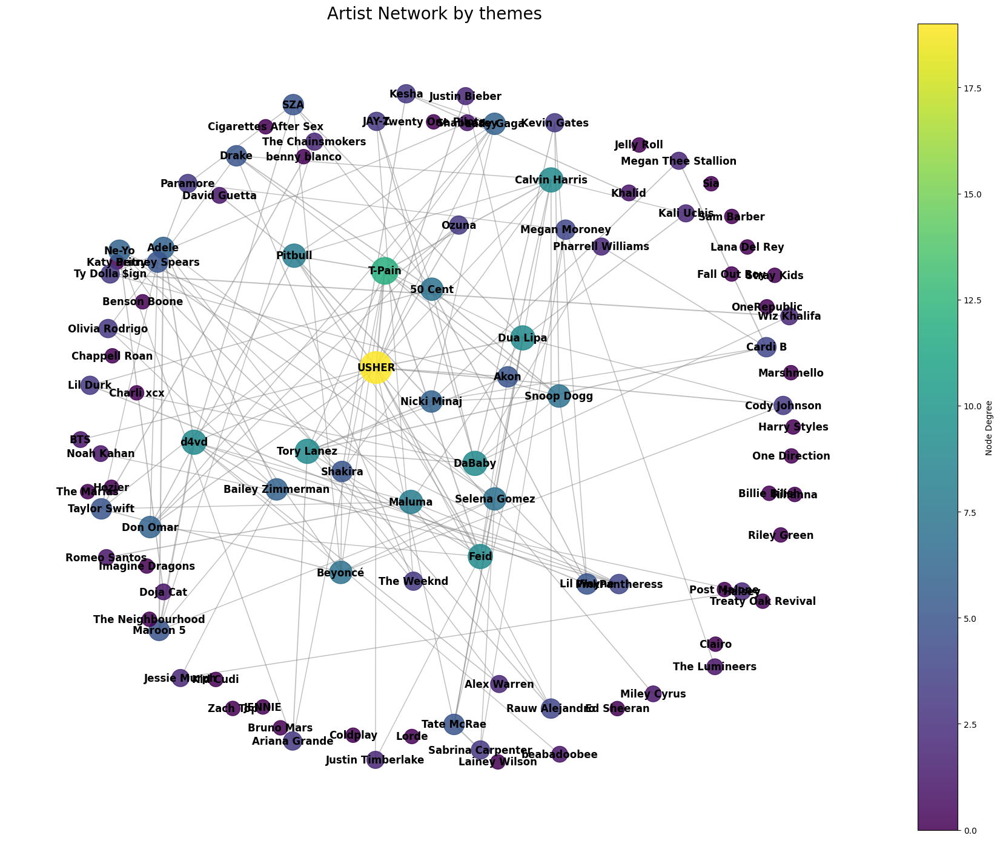

Drawing graph for feature: emotions


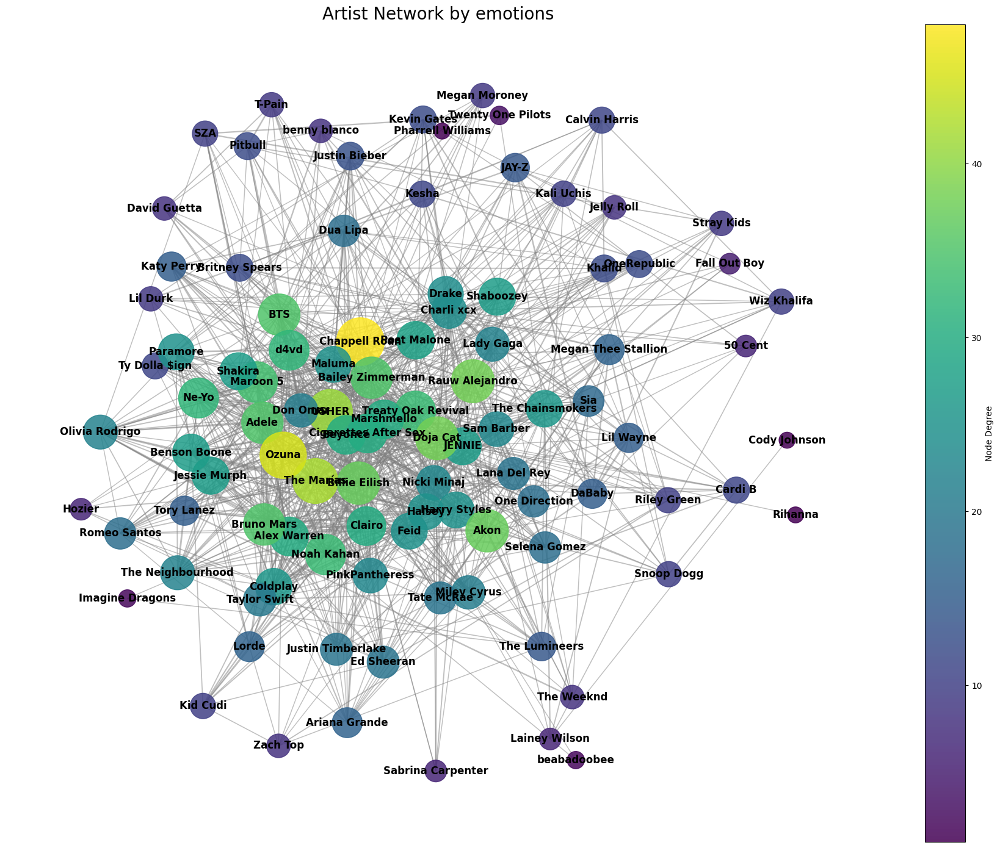

Drawing graph for feature: roberta_emotion


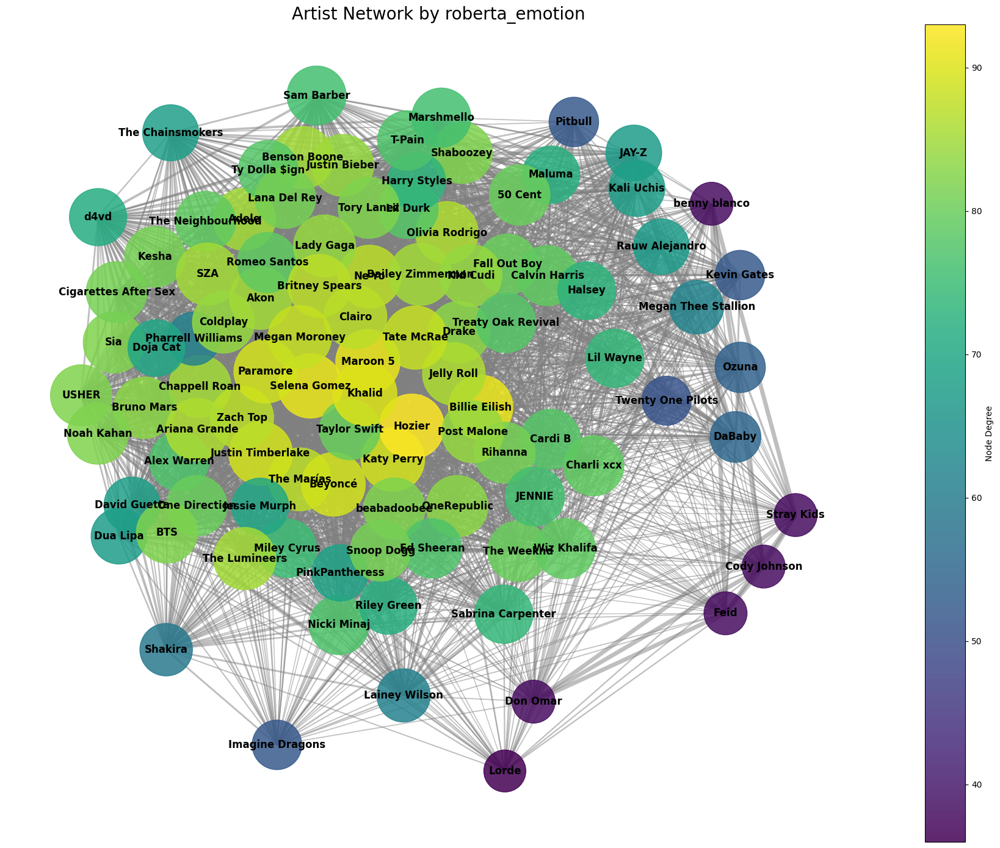

Drawing graph for feature: tfidf_themes


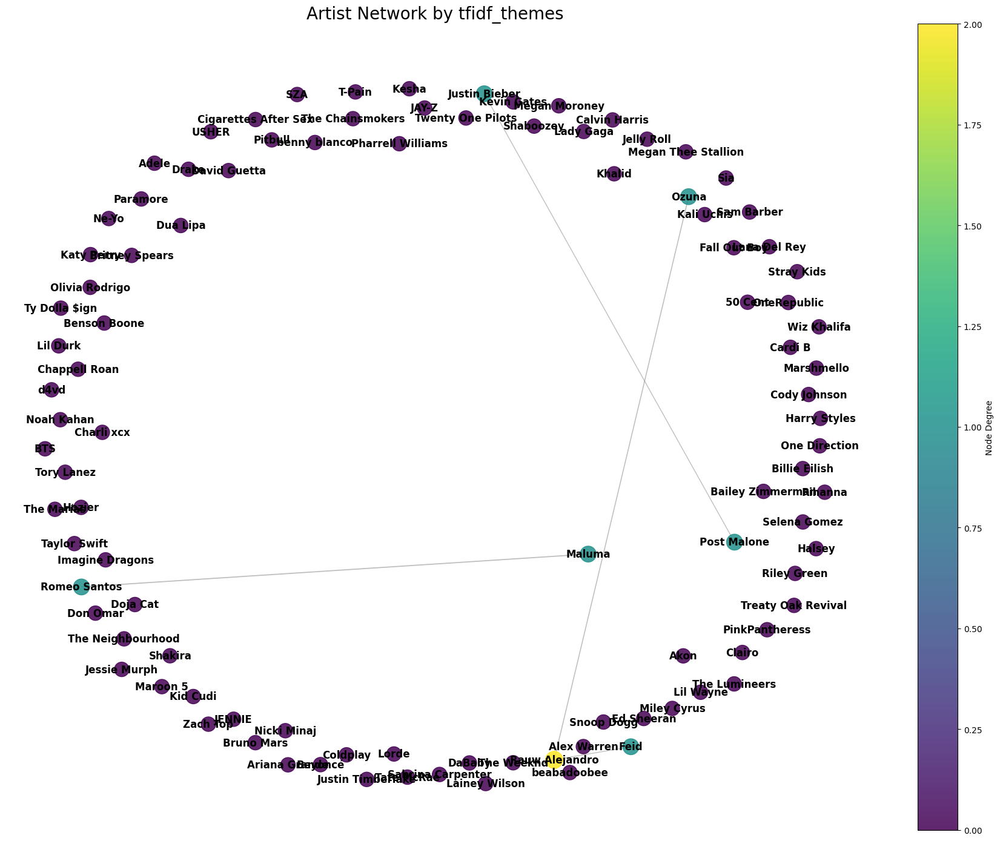

Drawing graph for NER entity: people


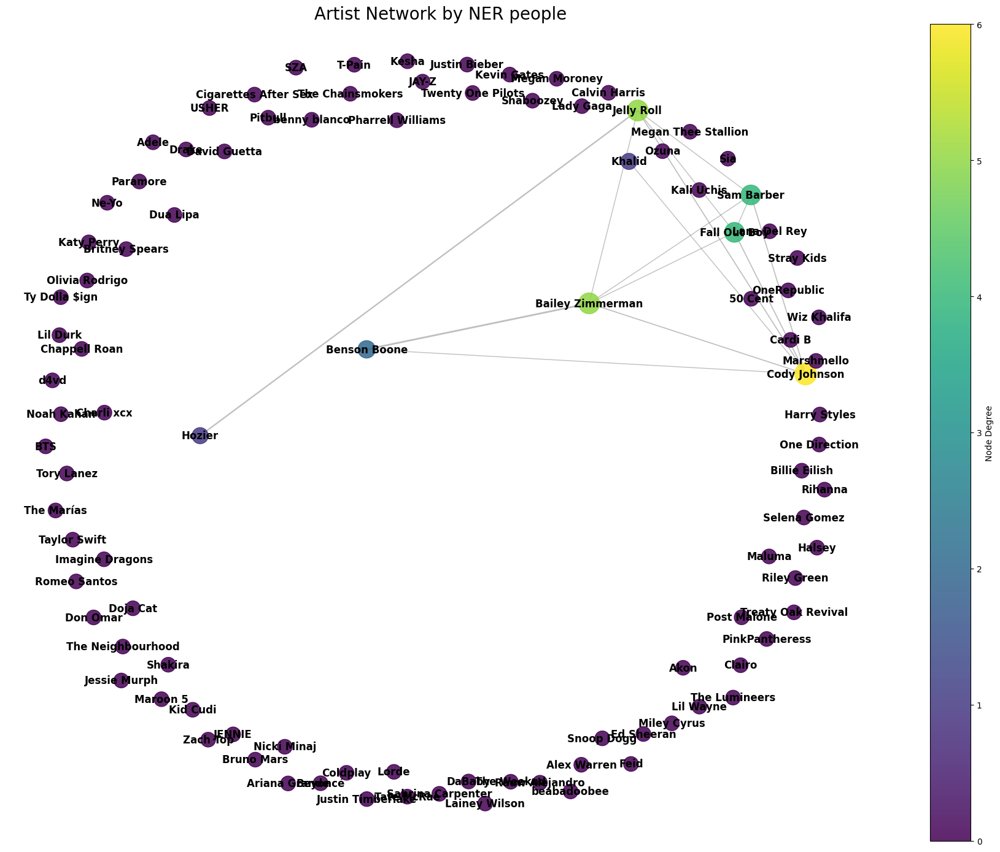

Drawing graph for NER entity: locations


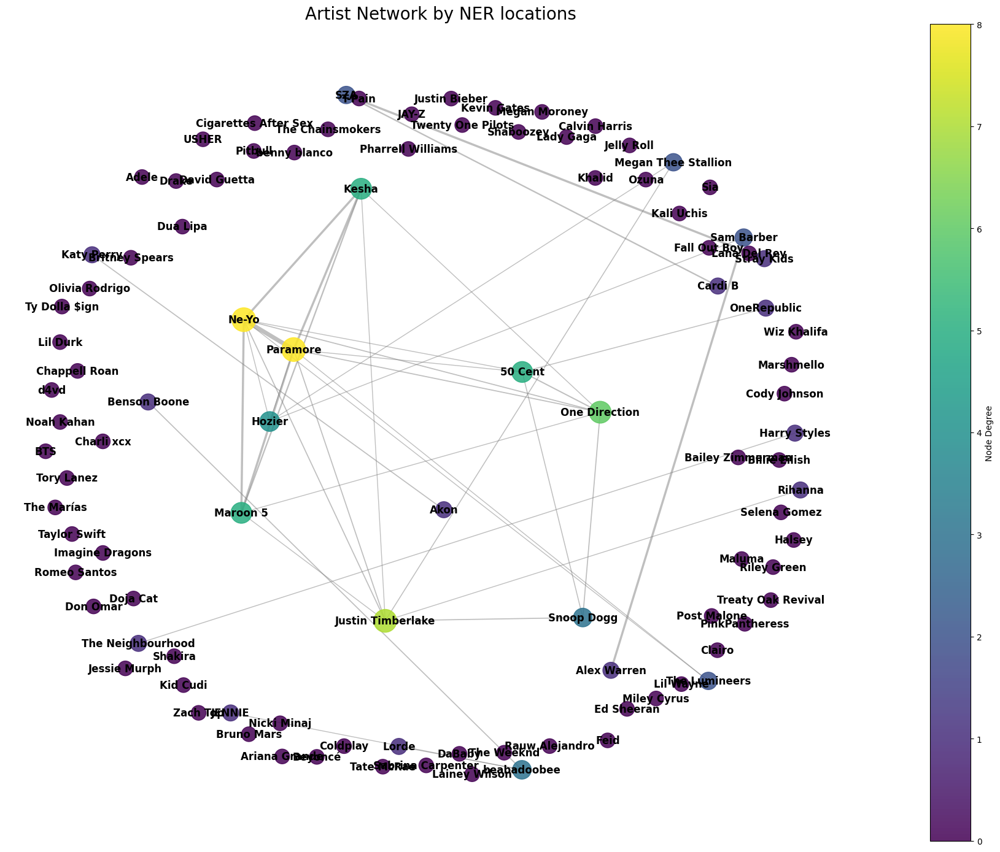

Drawing graph for NER entity: organizations


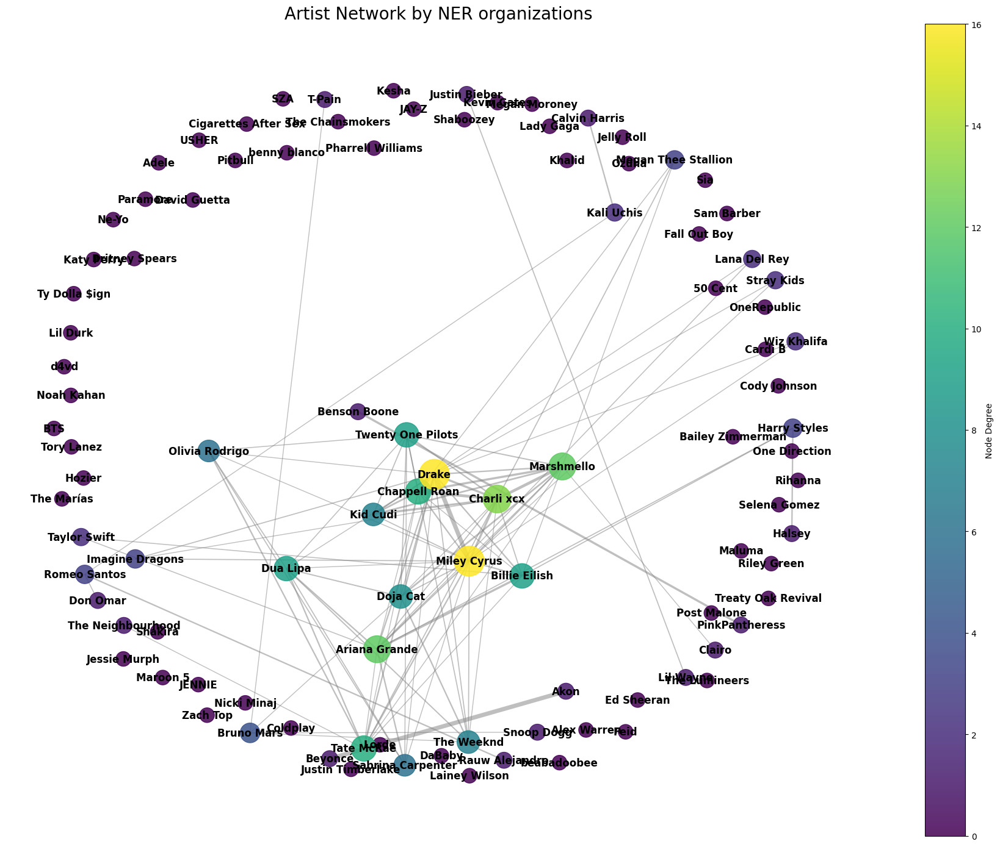

Drawing graph for cluster: pca_cluster


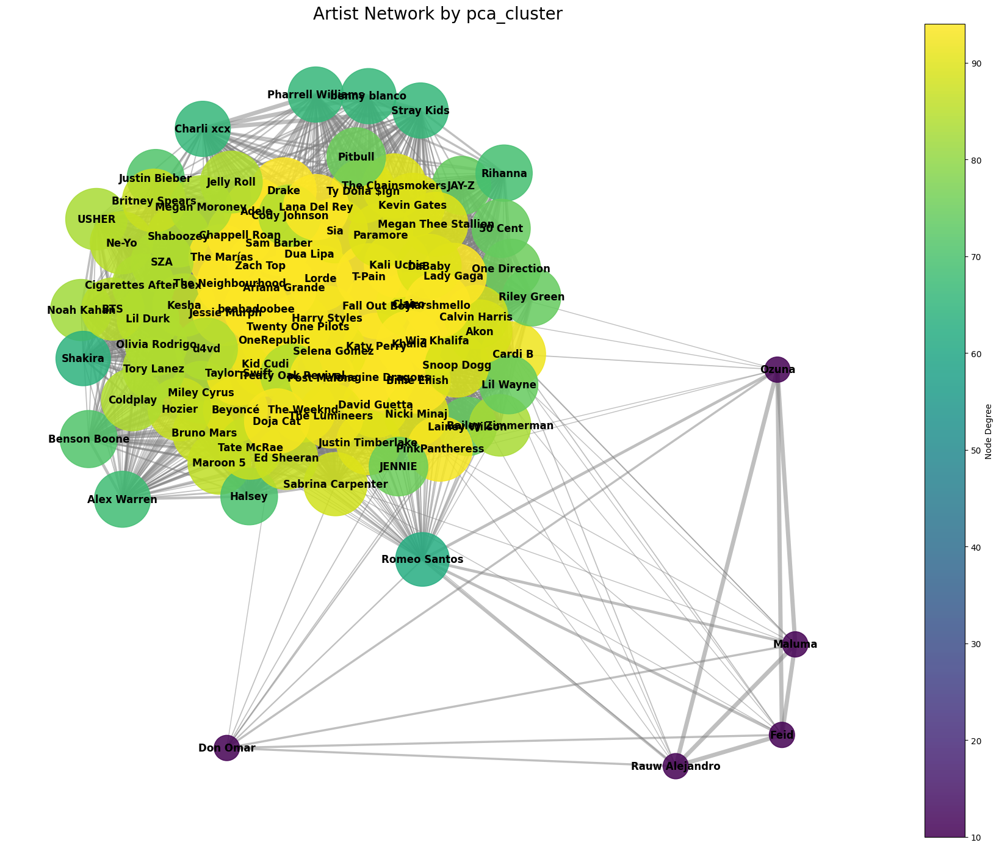

Drawing graph for cluster: tsne_cluster


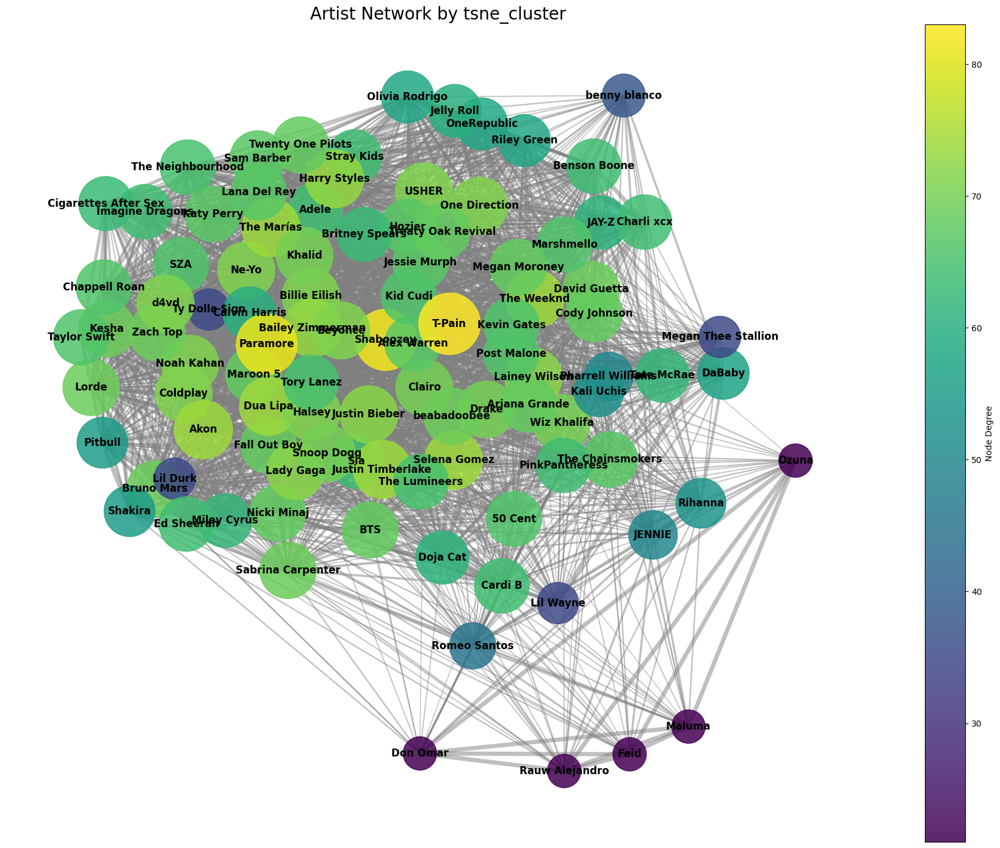

Drawing graph for all features (themes, emotions, roberta_emotion, tfidf_themes, NER, PCA, t-SNE)


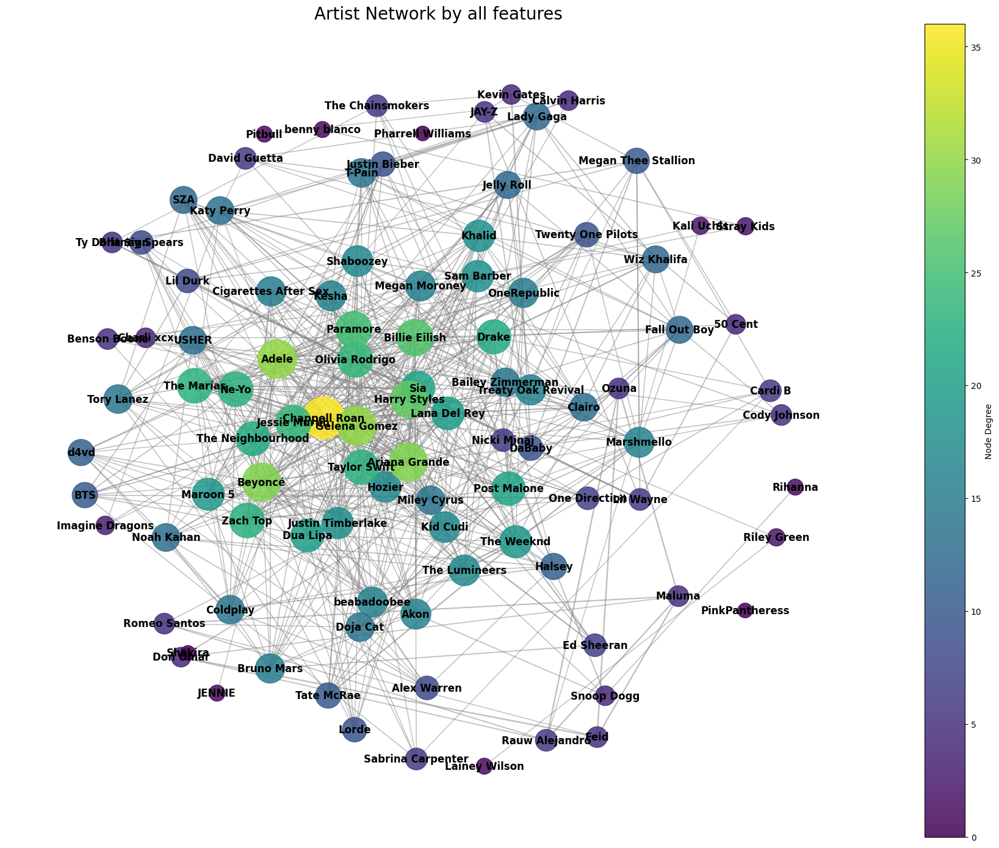

In [15]:
import json
import networkx as nx

def load_merged(path="all_lyrics_analysis_merged.json"):
    with open(path, "r", encoding="utf-8") as f:
        return json.load(f)

def get_artist_song_features(merged, feature):
    # 返回 {artist: [feature set]}
    artist_features = {}
    for artist, songs in merged.items():
        feature_set = set()
        for song, data in songs.items():
            values = data.get(feature, [])
            if isinstance(values, list):
                feature_set.update(values)
            elif isinstance(values, str):
                feature_set.add(values)
        artist_features[artist] = feature_set
    return artist_features

def get_artist_ner_entities(merged, ner_type):
    # 返回 {artist: [entity set]}
    artist_entities = {}
    for artist, songs in merged.items():
        entity_set = set()
        for song, data in songs.items():
            ner = data.get("ner", {})
            for ent in ner.get(ner_type, []):
                entity_set.add(ent)
        artist_entities[artist] = entity_set
    return artist_entities

def get_artist_pca_tsne_cluster(merged, cluster_type):
    # 返回 {artist: [cluster set]}
    artist_clusters = {}
    for artist, songs in merged.items():
        clusters = set()
        for song, data in songs.items():
            val = data.get(cluster_type)
            if val is not None:
                # 允许int或float
                if isinstance(val, list) and len(val) == 1:
                    clusters.add(val[0])
                else:
                    clusters.add(val)
        artist_clusters[artist] = clusters
    return artist_clusters

def compute_artist_similarity(set1, set2):
    if not set1 or not set2:
        return 0.0
    intersection = set1 & set2
    union = set1 | set2
    return len(intersection) / len(union) if union else 0.0

def build_artist_graph(merged, features, threshold=0.2, feature_mode="default"):
    G = nx.Graph()
    artists = list(merged.keys())
    if feature_mode == "default":
        artist_feature_dict = {feature: get_artist_song_features(merged, feature) for feature in features}
    elif feature_mode == "ner":
        artist_feature_dict = {feature: get_artist_ner_entities(merged, feature) for feature in features}
    elif feature_mode == "cluster":
        artist_feature_dict = {feature: get_artist_pca_tsne_cluster(merged, feature) for feature in features}
    else:
        raise ValueError("Unknown feature_mode")
    for artist in artists:
        G.add_node(artist)
    for i in range(len(artists)):
        for j in range(i+1, len(artists)):
            a1, a2 = artists[i], artists[j]
            sim_list = []
            for feature in features:
                set1 = artist_feature_dict[feature][a1]
                set2 = artist_feature_dict[feature][a2]
                sim = compute_artist_similarity(set1, set2)
                sim_list.append(sim)
            avg_sim = sum(sim_list) / len(sim_list)
            if avg_sim >= threshold:
                G.add_edge(a1, a2, weight=avg_sim)
    return G

def draw_graph(G, title):
    import matplotlib.pyplot as plt
    import numpy as np
    plt.figure(figsize=(18, 14))
    pos = nx.spring_layout(G, k=0.8, seed=42)
    degrees = dict(G.degree())
    node_colors = [degrees[n] for n in G.nodes()]
    weights = [G[u][v]['weight']*5 for u,v in G.edges()]
    nodes = nx.draw_networkx_nodes(
        G, pos,
        node_size=[300 + 60*degrees[n] for n in G.nodes()],
        node_color=node_colors,
        cmap=plt.cm.viridis,
        alpha=0.85
    )
    nx.draw_networkx_edges(
        G, pos,
        width=weights,
        edge_color='gray',
        alpha=0.5
    )
    nx.draw_networkx_labels(
        G, pos,
        font_size=12,
        font_color='black',
        font_weight='bold'
    )
    plt.title(title, fontsize=20)
    plt.axis("off")
    plt.colorbar(nodes, label="Node Degree")
    plt.tight_layout()
    plt.show()

def draw_all_graphs():
    merged = load_merged()
    all_features = ("themes", "emotions", "roberta_emotion", "tfidf_themes")
    ner_types = ("people", "locations", "organizations")
    cluster_types = ("pca_cluster", "tsne_cluster")
    threshold = 0.2

    # 先画单个属性
    for feature in all_features:
        print(f"Drawing graph for feature: {feature}")
        G_single = build_artist_graph(merged, features=(feature,), threshold=threshold, feature_mode="default")
        nx.write_graphml(G_single, f"artist_network_{feature}.graphml")
        draw_graph(G_single, f"Artist Network by {feature}")

    # NER属性
    for ner_type in ner_types:
        print(f"Drawing graph for NER entity: {ner_type}")
        G_ner = build_artist_graph(merged, features=(ner_type,), threshold=threshold, feature_mode="ner")
        nx.write_graphml(G_ner, f"artist_network_ner_{ner_type}.graphml")
        draw_graph(G_ner, f"Artist Network by NER {ner_type}")

    # 聚类属性
    for cluster_type in cluster_types:
        print(f"Drawing graph for cluster: {cluster_type}")
        G_cluster = build_artist_graph(merged, features=(cluster_type,), threshold=threshold, feature_mode="cluster")
        nx.write_graphml(G_cluster, f"artist_network_{cluster_type}.graphml")
        draw_graph(G_cluster, f"Artist Network by {cluster_type}")

    # 合并所有属性（包括NER和聚类）
    print("Drawing graph for all features (themes, emotions, roberta_emotion, tfidf_themes, NER, PCA, t-SNE)")
    all_combined_features = (
        "themes", "emotions", "roberta_emotion", "tfidf_themes",
        "people", "locations", "organizations",
        "pca_cluster", "tsne_cluster"
    )
    # 构建feature_mode列表，分别对应default/ner/cluster
    feature_mode_map = {
        "themes": "default", "emotions": "default", "roberta_emotion": "default", "tfidf_themes": "default",
        "people": "ner", "locations": "ner", "organizations": "ner",
        "pca_cluster": "cluster", "tsne_cluster": "cluster"
    }
    # 构建artist_feature_dict
    artist_feature_dict = {}
    for feature in all_combined_features:
        mode = feature_mode_map[feature]
        if mode == "default":
            artist_feature_dict[feature] = get_artist_song_features(merged, feature)
        elif mode == "ner":
            artist_feature_dict[feature] = get_artist_ner_entities(merged, feature)
        elif mode == "cluster":
            artist_feature_dict[feature] = get_artist_pca_tsne_cluster(merged, feature)
    artists = list(merged.keys())
    G_all = nx.Graph()
    for artist in artists:
        G_all.add_node(artist)
    for i in range(len(artists)):
        for j in range(i+1, len(artists)):
            a1, a2 = artists[i], artists[j]
            sim_list = []
            for feature in all_combined_features:
                set1 = artist_feature_dict[feature][a1]
                set2 = artist_feature_dict[feature][a2]
                sim = compute_artist_similarity(set1, set2)
                sim_list.append(sim)
            avg_sim = sum(sim_list) / len(sim_list)
            if avg_sim >= threshold:
                G_all.add_edge(a1, a2, weight=avg_sim)
    nx.write_graphml(G_all, "artist_network_all_features.graphml")
    draw_graph(G_all, "Artist Network by all features")

draw_all_graphs()


In [ ]:
|